### Import the Libraries

In [ ]:
from datetime import datetime

import folium
from folium.plugins import HeatMap

import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from pandas import Timestamp
pd.options.display.max_columns = 999
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

import pyproj
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import pysal.lib
from pysal.explore import esda
from pysal.lib import weights

# Using Plotline
from plotnine import *
from plotnine import scale_x_datetime, element_text
from mizani.breaks import date_breaks
from mizani.formatters import date_format

import plotly.graph_objects as go

plt.style.use('ggplot')
%matplotlib inline

In [2]:
# colour blind codes
color_codes = {
    'blue':    '#377eb8', 
    'orange':  '#ff7f00',
    'green':   '#4daf4a',
    'pink':    '#f781bf',
    'brown':   '#a65628',
    'purple':  '#984ea3',
    'gray':    '#999999',
    'red':     '#e41a1c',
    'yellow':  '#dede00'
} 

# Create a color gradient
colors = [color_codes['green'], color_codes['red']]
cmap = LinearSegmentedColormap.from_list('name', colors)

## Load the DATA
- Since we have LFB data for the last 3 years (2020-01-01 / 2023-01-31) I have filtered the LAS data according to it.
- We have two sheet_names which are HourlyCalls and IncidentsLSOA


This is London Ambulance Service data. LFB data is available publicaly: 
https://data.london.gov.uk/dataset/london-fire-brigade-incident-records?
 
    - First tab: Total Incidents (activity which has recieved a paramedic response or a call from an LAS clinician) aggregated by LSOA, by month.
 
    - Second tab: Total Contacts (Any call made to LAS, including transfers from 111 and calls from the MET) and 999 calls by date, hour for whole of London.
 
- The purpose of the datasets is to look for correlations and common factors associated with activity spatially (first dataset) and temporally (second dataset).
 
These could be cross-checked against public datasets for demographic and 
deprivation (Census, IMD).

In [3]:
# Import the data set
file_path = '../data/LAS/DataApril2023/LAS-From 2018 to 2023.xlsx'
HourlyCalls = pd.read_excel(file_path, engine='openpyxl', sheet_name='HourlyCalls')
IncidentsLSOA = pd.read_excel(file_path, engine='openpyxl', sheet_name='IncidentsLSOA')

In [4]:
# Ensure that the 'date' column is a datetime object
HourlyCalls['date'] = pd.to_datetime(HourlyCalls['date'])

# Specify start and end dates
start_date = '2020-01-01'
end_date = '2023-01-31'

# Create a mask of boolean values indicating whether each date is within the specified range
mask = (HourlyCalls['date'] >= start_date) & (HourlyCalls['date'] <= end_date)

# Apply the mask to the DataFrame to get a new DataFrame with dates within the specified range
HourlyCalls = HourlyCalls.loc[mask].reset_index(drop=True)

In [5]:
# Create a mask of boolean values indicating whether each date is within the specified range
mask_two = IncidentsLSOA['year'] >= 2021

# Apply the mask to the DataFrame to get a new DataFrame with dates within the specified range
IncidentsLSOA = IncidentsLSOA.loc[mask_two].reset_index(drop=True)

In [6]:
HourlyCalls.head()

,date,hour,totalcontacts,calls999
0,2020-01-01,0,373,315
1,2020-01-01,1,435,366
2,2020-01-01,2,493,415
3,2020-01-01,3,394,327
4,2020-01-01,4,298,254


In [7]:
IncidentsLSOA.head()

,year,month,LSOA11CD,total_incidents
0,2021,April,E01000875,9
1,2021,April,E01002242,25
2,2021,April,E01002512,20
3,2021,April,E01003805,8
4,2021,April,E01000994,13


## LAS EDA

**From 2020-01 to 2023-01**

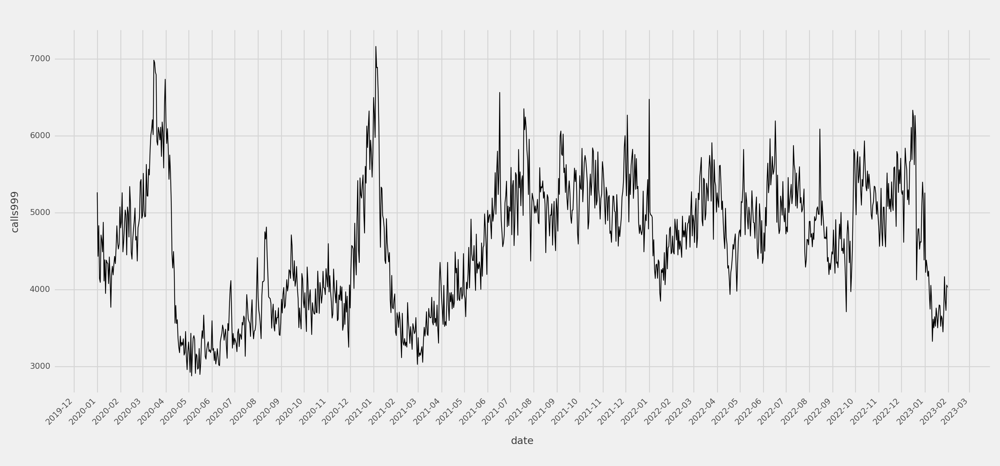

<Figure Size: (1500 x 700)>

In [8]:
# Aggregate the number of calls 999
london_filtered = HourlyCalls.groupby(['date'])['calls999'].sum().reset_index()

(
    ggplot(data=london_filtered) +
    aes(x='date', y='calls999') +
    geom_line() +
    theme_538() +
    scale_x_datetime(breaks=date_breaks('1 month'), labels=date_format('%Y-%m')) +
    theme(axis_text_x=element_text(rotation=45, hjust=1), figure_size=(15,7))
)

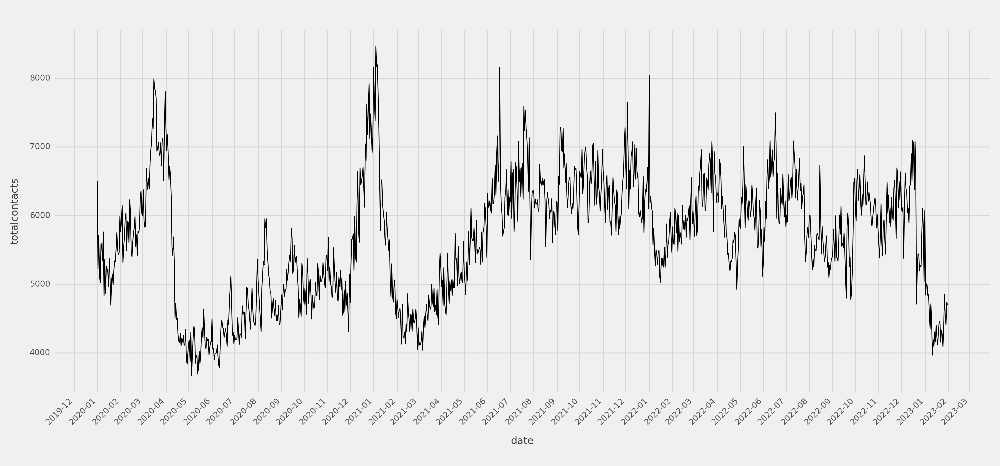

<Figure Size: (1500 x 700)>

In [9]:
# Aggregate the number of calls total contacts
london_filtered = HourlyCalls.groupby(['date'])['totalcontacts'].sum().reset_index()

(
    ggplot(data=london_filtered) +
    aes(x='date', y='totalcontacts') +
    geom_line() +
    theme_538() +
    scale_x_datetime(breaks=date_breaks('1 month'), labels=date_format('%Y-%m')) +
    theme(axis_text_x=element_text(rotation=45, hjust=1), figure_size=(15,7))
)

**Most calls dates in ascending order**
- As can be expected during the COVID time calls number were huge
- Last year highest call numbers dropped by 1000 for most of the dates
- My gut says that calling LAS is not related to summer of the year (temperature and humidity effect), in fact more like cold weather seasons

In [10]:
HourlyCalls.groupby(['date'])['totalcontacts'].sum().sort_values(ascending=False)

date
2021-01-04    8464
2021-01-06    8197
2021-01-05    8167
2021-01-01    8163
2021-06-17    8157
              ... 
2020-06-10    3811
2020-06-11    3784
2020-05-14    3772
2020-05-13    3694
2020-05-05    3664
Name: totalcontacts, Length: 1127, dtype: int64

- Let's look at the last year's numbers

In [11]:
# Filter dataframe based on date range
start_date = Timestamp("2021-01-01")
end_date = Timestamp("2023-01-31")

# Filter dataframe based on date range
london_filtered_last_year = HourlyCalls[(HourlyCalls['date'] >= start_date) & (HourlyCalls['date'] <= end_date)]

london_filtered_last_year.groupby(['date'])['totalcontacts'].sum().sort_values(ascending=False)[:5]


date
2021-01-04    8464
2021-01-06    8197
2021-01-05    8167
2021-01-01    8163
2021-06-17    8157
2022-01-01    8041
2021-01-07    7764
2021-01-02    7691
2021-12-03    7652
2021-07-19    7595
2021-07-21    7530
2022-06-17    7498
2021-01-03    7384
2021-09-06    7287
2021-11-30    7282
2021-09-05    7272
2021-09-09    7270
2021-01-08    7268
2021-07-22    7261
2021-07-20    7236
Name: totalcontacts, dtype: int64

In [12]:
def return_time_series_graph_two(start_date, end_date):
    start_date = Timestamp(start_date)
    end_date = Timestamp(end_date)
    
    # Filter dataframe based on date range
    london_filtered = HourlyCalls[(HourlyCalls['date'] >= start_date) &
                                  (HourlyCalls['date'] <= end_date)]

    london_filtered_last_year = london_filtered.groupby(['date'])['totalcontacts'].sum().reset_index()
    
    fig = go.Figure([go.Scatter(x=london_filtered_last_year['date'], y=london_filtered_last_year['totalcontacts'],
                            mode='lines+markers',
                            name='lines+markers')])

    # Add hover text
    fig.update_traces(hoverinfo='text', hovertext=
        ['Date: {}<br>Total Contacts: {}'.format(i, j) for i, j in zip(london_filtered_last_year['date'], london_filtered_last_year['totalcontacts'])])

    # Add labels
    start_date = london_filtered_last_year['date'].min().strftime('%Y-%m-%d')
    end_date = london_filtered_last_year['date'].max().strftime('%Y-%m-%d')
    fig.update_layout(title_text="From {} to {}".format(start_date, end_date),
                      xaxis_title="Date",
                      yaxis_title="Total Contacts")
    
    return fig


In [13]:
fig = return_time_series_graph_two("2020-01-01", "2023-01-31")
fig.show()

In [14]:
# fig = return_time_series_graph_two("2022-01-01", "2023-01-31")
# fig.show()

In [15]:
# fig = return_time_series_graph_two("2022-03-01", "2022-08-31")
# fig.show()

In [16]:
# fig = return_time_series_graph_two("2022-06-01", "2022-08-31")
# fig.show()

**Comparison of Number of calls per year**
Given that:
* year_2020_2021:  1910084
* year_2021_2022:  2161770
* year_2022_2023:  2192003

The number of calls LAS recevied increased by huge number between 20 and 2021 however not much between 21 and 22:

- Proportion of 2020-21 vs 2021-22:  %11.64
- Proportion of 2021-22 vs 2022-23:  %1.38

In [17]:
HourlyCalls['date'] = pd.to_datetime(HourlyCalls['date']).dt.date

## year 2020-2021
start_date = datetime.strptime("2020-01-01", "%Y-%m-%d").date()
end_date = datetime.strptime("2021-01-01", "%Y-%m-%d").date()

# Filter dataframe based on date range
london_filtered_2020 = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]


year_2020_2021 = london_filtered_2020.groupby(['date'])['totalcontacts'].sum()

## year 2021-2022
start_date = datetime.strptime("2021-01-01", "%Y-%m-%d").date()
end_date = datetime.strptime("2022-01-01", "%Y-%m-%d").date()

# Filter dataframe based on date range
london_filtered_2021 = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]


year_2021_2022 = london_filtered_2021.groupby(['date'])['totalcontacts'].sum()

## year 2022-2023
start_date = datetime.strptime("2022-01-01", "%Y-%m-%d").date()
end_date = datetime.strptime("2023-01-01", "%Y-%m-%d").date()

# Filter dataframe based on date range
london_filtered_2022 = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]


year_2022_2023 = london_filtered_2022.groupby(['date'])['totalcontacts'].sum()

print("year_2020_2021: ", str(year_2020_2021.sum()))
print("year_2021_2022: ", str(year_2021_2022.sum()))
print("year_2022_2023: ", str(year_2022_2023.sum()))
print("Proportion of 2020-21 vs 2021-22: ", "%"+str(round(((1 - year_2020_2021.sum() / year_2021_2022.sum()) * 100), 2)))
print("Proportion of 2021-22 vs 2022-23: ", "%"+str(round(((1 - year_2021_2022.sum() / year_2022_2023.sum()) * 100), 2)))

year_2020_2021:  1910084
year_2021_2022:  2161770
year_2022_2023:  2192003
Proportion of 2020-21 vs 2021-22:  %11.64
Proportion of 2021-22 vs 2022-23:  %1.38


**Last Summer vs Last Year Total Calls**

In [18]:
## LAST YEAR
start_date = datetime.strptime("2022-01-01", "%Y-%m-%d").date()
end_date = datetime.strptime("2023-01-01", "%Y-%m-%d").date()

# Filter dataframe based on date range
london_filtered_last_year = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]


last_year = london_filtered_last_year.groupby(['date'])['totalcontacts'].sum()



## LAST SUMMER
start_date = datetime.strptime("2022-06-01", "%Y-%m-%d").date()
end_date = datetime.strptime("2022-08-31", "%Y-%m-%d").date()

# Filter dataframe based on date range
london_filtered_last_summer = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]

last_summer = london_filtered_last_summer.groupby(['date'])['totalcontacts'].sum()


print("Last year: ", str(last_year.sum()))
print("Last summer: ", str(last_summer.sum()))
print("Proportion: ", "%"+str(round((last_summer.sum() / last_year.sum() * 100), 2)))


Last year:  2192003
Last summer:  557960
Proportion:  %25.45


**Call trend by the hour of day**
* From the distribution, we can clearly see that the number of calls are higher in PM compare to AM. 
* 18:00 being the highest
* Count of calls starts increasing from 05:00 till 18:00, then starts descreasing gradually
* Last Summer almost had same pattern of calls with last 3 years of all

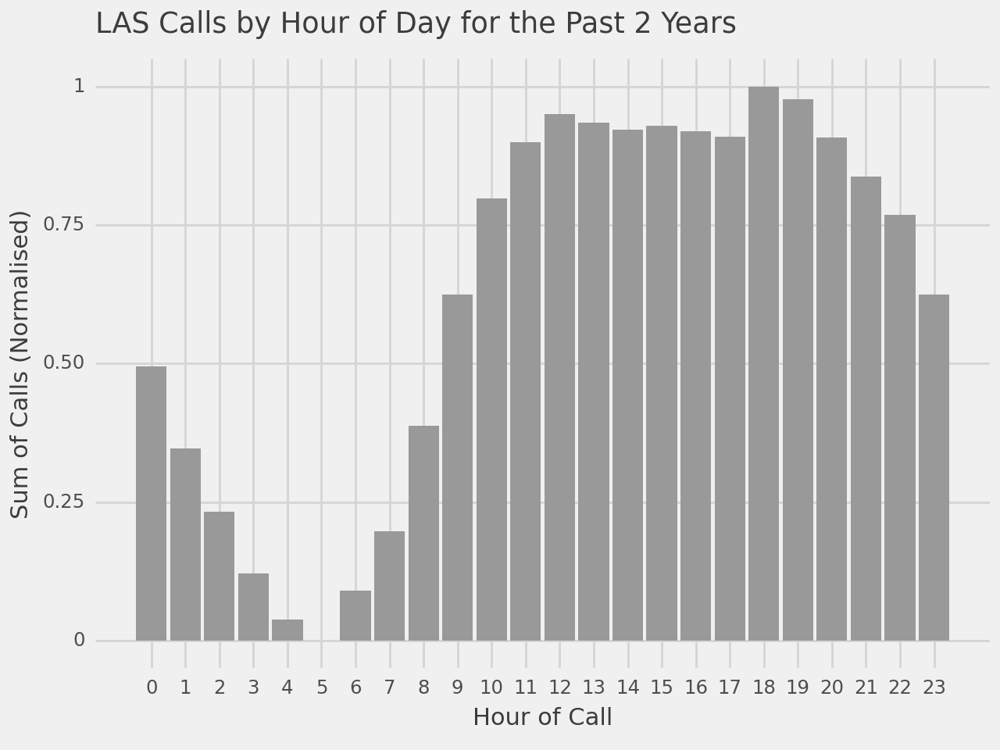

<Figure Size: (640 x 480)>

In [19]:
start_date = pd.Timestamp("2021-01-01").date()
end_date = pd.Timestamp("2023-01-31").date()

# Filter dataframe based on date range
london_filtered = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]

# Create a new dataframe where each 'HourOfCall' is associated with the sum of 'NumCalls'
london_hourly = london_filtered.groupby('hour')['totalcontacts'].sum().reset_index()
london_hourly[['totalcontacts_norm']] = scaler.fit_transform(london_hourly[['totalcontacts']])

# Now, plot this data with ggplot
(ggplot(data=london_hourly) 
 + aes(x='hour', y='totalcontacts_norm') 
 + geom_col(fill=color_codes['gray']) 
 + ggtitle('LAS Calls by Hour of Day for the Past 2 Years')
 + xlab('Hour of Call') 
 + ylab('Sum of Calls (Normalised)') 
 + theme_538()
 + scale_x_continuous(breaks=range(0, 24, 1)))

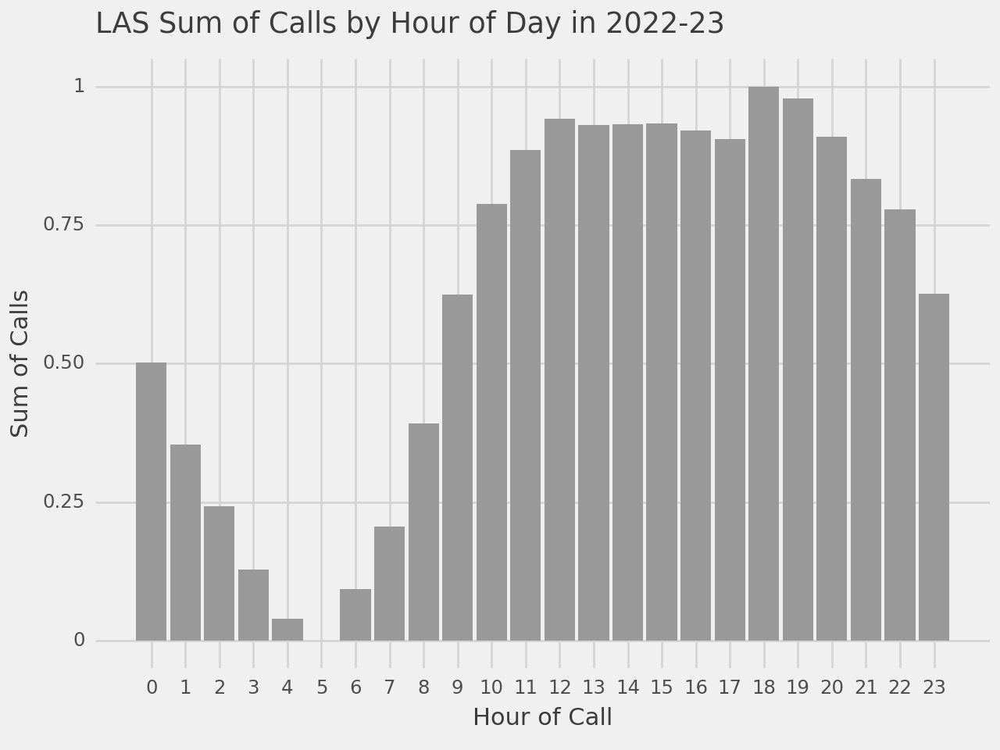

<Figure Size: (640 x 480)>

In [20]:
start_date = pd.Timestamp("2022-01-01").date()
end_date = pd.Timestamp("2023-01-31").date()

# Filter dataframe based on date range
london_filtered = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]

# Create a new dataframe where each 'HourOfCall' is associated with the sum of 'NumCalls'
london_hourly = london_filtered.groupby('hour')['totalcontacts'].sum().reset_index()
london_hourly[['totalcontacts_norm']] = scaler.fit_transform(london_hourly[['totalcontacts']])

# Now, plot this data with ggplot
(ggplot(data=london_hourly) 
 + aes(x='hour', y='totalcontacts_norm') 
 + geom_col(fill=color_codes['gray']) 
 + ggtitle('LAS Sum of Calls by Hour of Day in 2022-23')
 + xlab('Hour of Call') 
 + ylab('Sum of Calls') 
 + theme_538()
 + scale_x_continuous(breaks=range(0, 24, 1)))

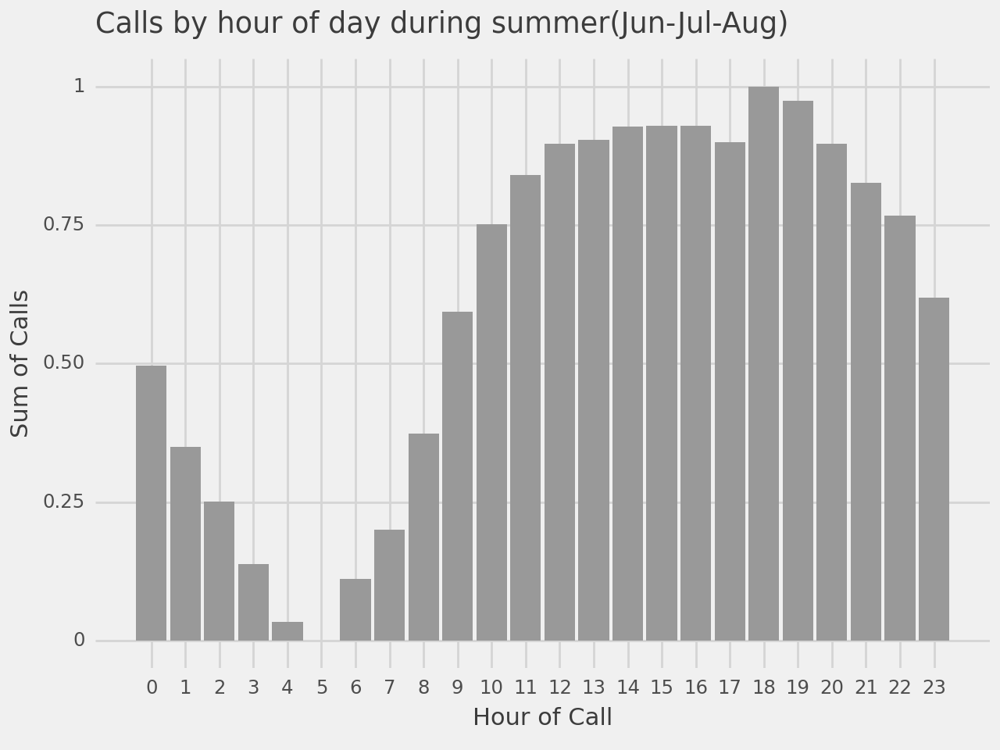

<Figure Size: (640 x 480)>

In [21]:
start_date = pd.Timestamp("2022-06-01").date()
end_date = pd.Timestamp("2022-08-31").date()

# Filter dataframe based on date range
london_filtered = HourlyCalls[(HourlyCalls['date'] >= start_date) 
                         & (HourlyCalls['date'] <= end_date)]

# Create a new dataframe where each 'HourOfCall' is associated with the sum of 'NumCalls'
london_hourly = london_filtered.groupby('hour')['totalcontacts'].sum().reset_index()
london_hourly[['totalcontacts_norm']] = scaler.fit_transform(london_hourly[['totalcontacts']])

# Now, plot this data with ggplot
(ggplot(data=london_hourly) 
 + aes(x='hour', y='totalcontacts_norm') 
 + geom_col(fill=color_codes['gray']) 
 + ggtitle('Calls by hour of day during summer(Jun-Jul-Aug)')
 + xlab('Hour of Call') 
 + ylab('Sum of Calls') 
 + theme_538()
 + scale_x_continuous(breaks=range(0, 24, 1)))

**Type of Calls**
- Unlike LFB, for LAS we do not have data for the type calls: Such as Fake, or Emergency etc.

## Calls by Borough Analysis

**Although for LFB we have outcome level borough names, we do not have it for LAS. Therefore we can only make our demographics search on Borough Level**

#### Merge the LAS data with LSOA to get the Borough Names

In [22]:
# Read the .xls file
lsoa_country_of_birth_file_path = '../data/LSOA-Census-Demographics/Country of birth.xlsx'
LSOA_country_of_birth = pd.read_excel(lsoa_country_of_birth_file_path, engine='openpyxl', sheet_name='2021')

In [23]:
print("LSOA_country_of_birth total no unique borough code: ", len(LSOA_country_of_birth['LSOA code'].unique()))
print("Incidents total no unique borough code ", len(IncidentsLSOA.LSOA11CD.unique()))

LSOA_country_of_birth total no unique borough code:  4994
Incidents total no unique borough code  5678


In [24]:
# merge with inner
merged_df = IncidentsLSOA.merge(LSOA_country_of_birth, how='inner', left_on='LSOA11CD', right_on='LSOA code')
# drop the 'LSOA code' column
merged_df = merged_df.drop(columns=['LSOA code'])

In [25]:
# Latitude and Longitude of Borough Data
lsoa_location = pd.read_csv("../data/LSOA-Census-Demographics/lsoa_latlong.csv")

In [26]:
# merge with inner
merged_df = merged_df.merge(lsoa_location, how='inner', left_on='LSOA11CD', right_on='lsoa11cd')
# drop the 'LSOA code' column
merged_df = merged_df.drop(columns=['lsoa11cd'])
merged_df.head()

,year,month,LSOA11CD,total_incidents,local authority name,local authority code,All Usual residents,United Kingdom,European Union EU14,Other EU countries,non-EU Europe,Africa,Middle East and Asia,Americas and Caribbean,"Australasia, other Oceania and Other including British Overseas Territories",longitude,latitude
0,2021,April,E01000875,9,Camden,E09000007,1573,786,234,83,40,122,180,106,22,-0.20467,51.550127
1,2021,August,E01000875,12,Camden,E09000007,1573,786,234,83,40,122,180,106,22,-0.20467,51.550127
2,2021,December,E01000875,21,Camden,E09000007,1573,786,234,83,40,122,180,106,22,-0.20467,51.550127
3,2021,February,E01000875,18,Camden,E09000007,1573,786,234,83,40,122,180,106,22,-0.20467,51.550127
4,2021,January,E01000875,27,Camden,E09000007,1573,786,234,83,40,122,180,106,22,-0.20467,51.550127


In [27]:
las_data_frame = merged_df.iloc[:, :5].copy()

In [28]:
las_data_frame.head()

,year,month,LSOA11CD,total_incidents,local authority name
0,2021,April,E01000875,9,Camden
1,2021,August,E01000875,12,Camden
2,2021,December,E01000875,21,Camden
3,2021,February,E01000875,18,Camden
4,2021,January,E01000875,27,Camden


---------------

In [29]:
las_by_borough_last_2_years = merged_df.groupby(["local authority name"])["total_incidents"].sum().sort_values(ascending=False)

In [30]:
norm = plt.Normalize(las_by_borough_last_2_years.min(), las_by_borough_last_2_years.max())

<ipython-input-31-673ed998c2d4>:3: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



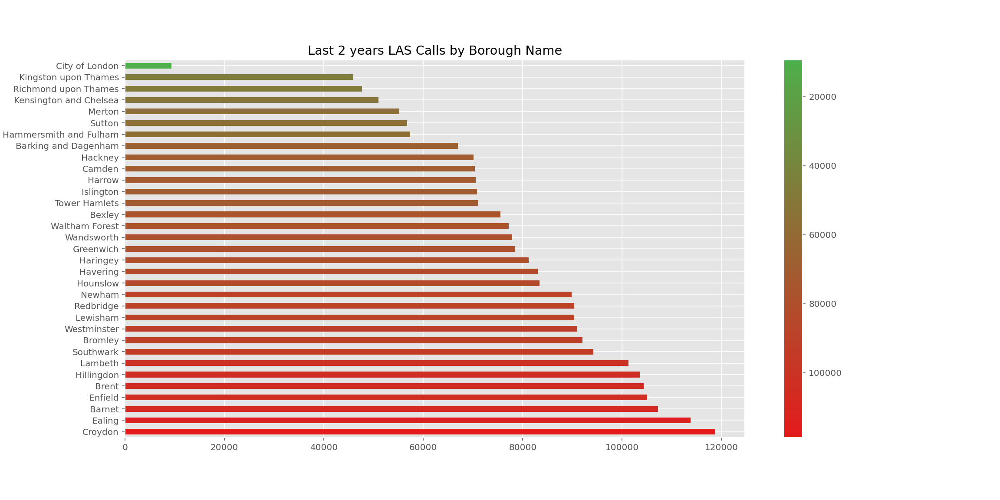

In [31]:
# Plot
las_by_borough_last_2_years.plot(kind='barh', figsize=[16,8], title='Last 2 years LAS Calls by Borough Name', color=cmap(norm(las_by_borough_last_2_years.values)))
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap))
cbar.ax.invert_yaxis()
plt.show()

# LAS vs LFB

In [32]:
las = merged_df.copy()


In [33]:
# Import the data set
lfb_data = pd.read_csv('../data/LFB/LFB Incident data 2020 to 2023.csv')

# Convert "DateOfCall" to datetime format
lfb_data['DateOfCall'] = pd.to_datetime(lfb_data['DateOfCall'], format='%d %b %Y')

# Create a new column "CalMonth" with the month names
lfb_data['CalMonth'] = lfb_data['DateOfCall'].dt.month_name()


In [34]:
lfb = lfb_data.copy()
max(lfb.DateOfCall)

Timestamp('2023-01-31 00:00:00')

In [35]:
# Group both dataframes by year and month
las_grouped = las.groupby(['year', 'month'], as_index=False)['total_incidents'].sum()
lfb_grouped = lfb.groupby(['CalYear', 'CalMonth'], as_index=False)['NumCalls'].sum()

# Rename columns for clarity and consistency
las_grouped.rename(columns={'year': 'Year', 'month': 'Month', 'total_incidents': 'LAS_Calls'}, inplace=True)
lfb_grouped.rename(columns={'CalYear': 'Year', 'CalMonth': 'Month', 'NumCalls': 'LFB_Calls'}, inplace=True)

# Merge both dataframes
las_lfb = pd.merge(las_grouped, lfb_grouped, how='inner', on=['Year', 'Month'])

In [36]:
las_lfb.head()

,Year,Month,LAS_Calls,LFB_Calls
0,2021,April,98230,11798.0
1,2021,August,101276,11958.0
2,2021,December,104076,11664.0
3,2021,February,88106,9117.0
4,2021,January,112021,8963.0


--------------

## Spatial Correlation Analysis

In [37]:
# Group both dataframes by year and month
cor_las_grouped = las.groupby(['year', 'month', 'local authority name', 'longitude', 'latitude'], as_index=False)['total_incidents'].sum()
cor_lfb_grouped = lfb.groupby(['CalYear', 'CalMonth', 'ProperCase', 'Easting_rounded', 'Northing_rounded'], as_index=False)['NumCalls'].sum()

# Rename columns for clarity and consistency
cor_las_grouped.rename(columns={'total_incidents': 'LAS_calls'}, inplace=True)
cor_lfb_grouped.rename(columns={'CalYear': 'year', 'CalMonth': 'month', 'NumCalls': 'LFB_calls', 'ProperCase': 'local authority name'}, inplace=True)

# Merge both dataframes
# spa_corr_las_lfb = pd.merge(cor_las_grouped, cor_lfb_grouped, how='inner', on=['Year', 'Month', 'local authority name'])

In [38]:
# Define the projection
wgs84 = pyproj.Proj("epsg:4326") # WGS 84 - latitude and longitude
osng = pyproj.Proj("epsg:27700") # British National Grid

# Define the transformer
transformer = pyproj.Transformer.from_proj(osng, wgs84)

# Create a function to convert Easting/Northing to Lon/Lat
def to_lonlat(easting, northing):
    lon, lat = transformer.transform(easting, northing)
    return Point(lon, lat)

In [39]:
# Apply the function to the Easting and Northing columns
cor_lfb_grouped['geometry'] = cor_lfb_grouped.apply(lambda row: to_lonlat(row.Easting_rounded, row.Northing_rounded), axis=1)

In [40]:
# Convert the DataFrame to a GeoDataFrame
cor_lfb_grouped = gpd.GeoDataFrame(cor_lfb_grouped, geometry='geometry')

# Drop the lat and long columns
cor_lfb_grouped = cor_lfb_grouped.drop(columns=['Easting_rounded', 'Northing_rounded'], axis=1)

In [41]:
# Convert the DataFrame to a GeoDataFrame
cor_las_grouped = gpd.GeoDataFrame(
    cor_las_grouped, geometry=gpd.points_from_xy(cor_las_grouped.latitude, cor_las_grouped.longitude), crs="EPSG:4326"
)

In [42]:
# Drop the lat and long columns
cor_las_grouped = cor_las_grouped.drop(columns=['longitude', 'latitude'], axis=1)

In [43]:
cor_las_grouped.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 125515 entries, 0 to 125514
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   year                  125515 non-null  int64   
 1   month                 125515 non-null  object  
 2   local authority name  125515 non-null  object  
 3   LAS_calls             125515 non-null  int64   
 4   geometry              125515 non-null  geometry
dtypes: geometry(1), int64(2), object(2)
memory usage: 4.8+ MB


In [44]:
cor_lfb_grouped.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 275875 entries, 0 to 275874
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   year                  275875 non-null  int64   
 1   month                 275875 non-null  object  
 2   local authority name  275875 non-null  object  
 3   LFB_calls             275875 non-null  float64 
 4   geometry              275875 non-null  geometry
dtypes: float64(1), geometry(1), int64(1), object(2)
memory usage: 10.5+ MB


### Moran’s I and Geary’s C


Firstly, it's necessary to create a spatial weights matrix for your data. This matrix defines the spatial relationship between the observations (i.e., how the spatial arrangement of the local authorities influences the correlations). The most common type of spatial weights matrix is the "queen" matrix, which defines two observations as neighbors if they share a border.

In [45]:
# Create a spatial weight matrix using K-nearest neighbors for LAS data
w_las = weights.KNN.from_dataframe(cor_las_grouped, k=10)  # you can adjust 'k' as needed

# Create a spatial weight matrix using K-nearest neighbors for LFB data
w_lfb = weights.KNN.from_dataframe(cor_lfb_grouped, k=10)  # you can adjust 'k' as needed

# Normalize the weights matrices
w_las.transform = 'r'
w_lfb.transform = 'r'


/Users/mahsumkocabey/opt/anaconda3/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning:

The weights matrix is not fully connected: 
 There are 4649 disconnected components.

/Users/mahsumkocabey/opt/anaconda3/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning:

The weights matrix is not fully connected: 
 There are 1615 disconnected components.



**Note:** If the number of disconnected components is small compared to the total number of observations, and if you're primarily interested in general trends rather than precise measurements, you may still get valuable insights despite the warning. But if the warning points to a significant issue (e.g., most of your data points are disconnected), you'd likely need to address it for reliable analysis.

In [46]:
# Compute Geary's C for LAS
geary_las = esda.Geary(cor_las_grouped['LAS_calls'], w_las)
print(f"Geary's C for LAS: {geary_las.C}, p-value: {geary_las.p_sim}")

# Compute Geary's C for LFB
geary_lfb = esda.Geary(cor_lfb_grouped['LFB_calls'], w_lfb)
print(f"Geary's C for LFB: {geary_lfb.C}, p-value: {geary_lfb.p_sim}")


Geary's C for LAS: 0.21953856183965825, p-value: 0.001
Geary's C for LFB: 0.9480285309651274, p-value: 0.001


In [47]:
# Compute Moran's I for LAS
moran_las = esda.Moran(cor_las_grouped['LAS_calls'], w_las)
print(f"Moran's I for LAS: {moran_las.I}, p-value: {moran_las.p_sim}")

# Compute Moran's I for LFB
moran_lfb = esda.Moran(cor_lfb_grouped['LFB_calls'], w_lfb)
print(f"Moran's I for LFB: {moran_lfb.I}, p-value: {moran_lfb.p_sim}")

Moran's I for LAS: 0.788408605156765, p-value: 0.001
Moran's I for LFB: 0.04919833648085322, p-value: 0.001


----------


**Correlation Coefficient between LAS and LFB call volumes**

In [48]:
las_lfb_corr = las_lfb.copy()
# Apply the scaler to 'LFB_Calls' and 'LAS_Calls'
las_lfb_corr[['LFB_Calls_norm', 'LAS_Calls_norm']] = scaler.fit_transform(las_lfb_corr[['LFB_Calls', 'LAS_Calls']])

# Create a new column that contains the date (only the year and month)
las_lfb_corr.loc[:, 'Date'] = pd.to_datetime(las_lfb_corr['Year'].astype(str) + ' ' + las_lfb_corr['Month'], format="%Y %B")

# Sort the dataframe by 'Date' before plotting
las_lfb_corr = las_lfb_corr.sort_values(by='Date')

# Group by 'Month'
grouped_by_month = las_lfb_corr.groupby('Month')

# Calculate correlation for each month
correlation_by_month = grouped_by_month.apply(lambda x: x['LFB_Calls_norm'].corr(x['LAS_Calls_norm']))

print("Correlation Coefficient between LAS and LFB call volumes by each month: \n", correlation_by_month)

print("")

# Group by 'Year'
grouped_by_year = las_lfb_corr.groupby('Year')

# Calculate correlation for each month
correlation_by_year = grouped_by_year.apply(lambda x: x['LFB_Calls_norm'].corr(x['LAS_Calls_norm']))

print("Correlation Coefficient between LAS and LFB call volumes by each year: \n", correlation_by_year)

Correlation Coefficient between LAS and LFB call volumes by each month: 
 Month
April       -1.00000
August      -1.00000
December    -1.00000
February     1.00000
January     -0.96634
July        -1.00000
June        -1.00000
March        1.00000
May         -1.00000
November    -1.00000
October     -1.00000
September   -1.00000
dtype: float64

Correlation Coefficient between LAS and LFB call volumes by each year: 
 Year
2021    0.318297
2022   -0.108082
2023         NaN
dtype: float64


/Users/mahsumkocabey/opt/anaconda3/lib/python3.8/site-packages/numpy/lib/function_base.py:2845: RuntimeWarning:

Degrees of freedom <= 0 for slice



**Visualising to see similar trends or patterns**

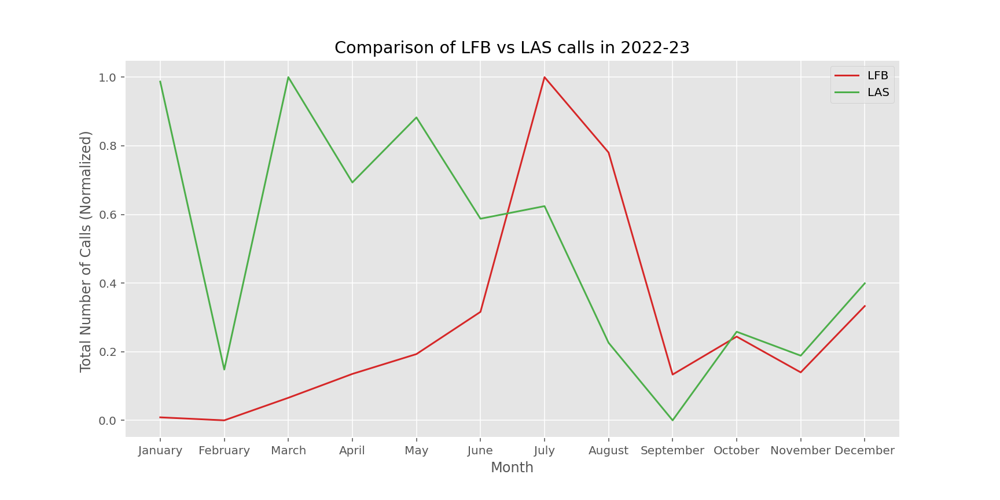

In [49]:
# Filter the dataframe for the year 2022
merged_df_2022 = las_lfb.loc[merged_df['year'] == 2022].copy()

# Apply the scaler to 'LFB_Calls' and 'LAS_Calls'
merged_df_2022[['LFB_Calls_norm', 'LAS_Calls_norm']] = scaler.fit_transform(merged_df_2022[['LFB_Calls', 'LAS_Calls']])

# Create a new column that contains the date (only the year and month)
merged_df_2022.loc[:, 'Date'] = pd.to_datetime(merged_df_2022['Year'].astype(str) + ' ' + merged_df_2022['Month'], format="%Y %B")

# Sort the dataframe by 'Date' before plotting
merged_df_2022_sorted = merged_df_2022.sort_values(by='Date')

# Now re-plot your data
plt.figure(figsize=(12,6))

plt.plot(merged_df_2022_sorted['Month'], merged_df_2022_sorted['LFB_Calls_norm'], label='LFB', color='#d62728')
plt.plot(merged_df_2022_sorted['Month'], merged_df_2022_sorted['LAS_Calls_norm'], label='LAS', color='#4daf4a')
plt.legend(loc='best')
plt.title('Comparison of LFB vs LAS calls in 2022-23')
plt.xlabel('Month')
plt.ylabel('Total Number of Calls (Normalized) ')
plt.show()

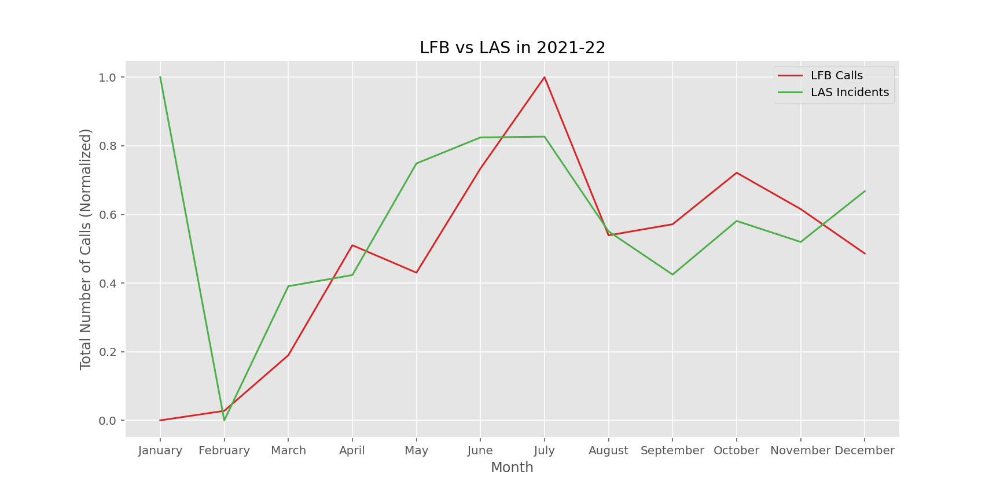

In [50]:
# Filter the dataframe for the year 2022
merged_df_2021 = las_lfb.loc[merged_df['year'] == 2021].copy()

# Apply the scaler to 'LFB_Calls' and 'LAS_Calls'
merged_df_2021[['LFB_Calls_norm', 'LAS_Calls_norm']] = scaler.fit_transform(merged_df_2021[['LFB_Calls', 'LAS_Calls']])

# Create a new column that contains the date (only the year and month)
merged_df_2021.loc[:, 'Date'] = pd.to_datetime(merged_df_2021['Year'].astype(str) + ' ' + merged_df_2021['Month'], format="%Y %B")

# Sort the dataframe by 'Date' before plotting
merged_df_2021_sorted = merged_df_2021.sort_values(by='Date')

# Now re-plot your data
plt.figure(figsize=(12,6))

plt.plot(merged_df_2021_sorted['Month'], merged_df_2021_sorted['LFB_Calls_norm'], label='LFB Calls', color='#d62728')
plt.plot(merged_df_2021_sorted['Month'], merged_df_2021_sorted['LAS_Calls_norm'], label='LAS Incidents', color='#4daf4a')
plt.legend(loc='best')
plt.title('LFB vs LAS in 2021-22')
plt.xlabel('Month')
plt.ylabel('Total Number of Calls (Normalized)')
plt.show()


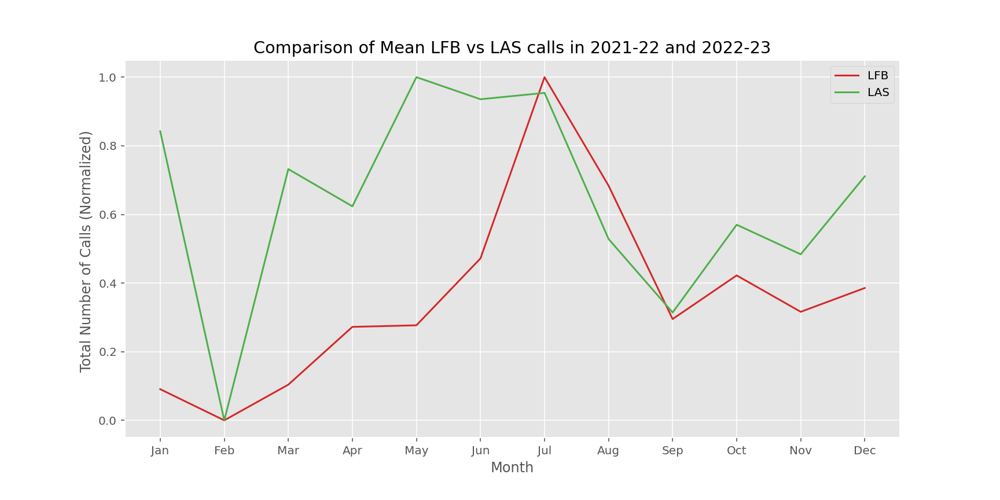

In [51]:
# Filter the dataframe for the years 2021 and 2022
merged_df_21_22 = las_lfb.loc[merged_df['year'] >= 2021].copy()

# Calculate the mean of the months across the years
merged_df_mean = merged_df_21_22.groupby(['Month']).mean().reset_index()

# Apply the scaler to 'LFB_Calls' and 'LAS_Calls'
merged_df_mean[['LFB_Calls_norm', 'LAS_Calls_norm']] = scaler.fit_transform(merged_df_mean[['LFB_Calls', 'LAS_Calls']])

# Create a new column that contains the date (only the month)
merged_df_mean.loc[:, 'Date'] = pd.to_datetime(merged_df_mean['Month'], format="%B")

# Sort the dataframe by 'Date' before plotting
merged_df_sorted = merged_df_mean.sort_values(by='Date')

# Now re-plot your data
plt.figure(figsize=(12,6))

plt.plot(merged_df_sorted['Date'].dt.month, merged_df_sorted['LFB_Calls_norm'], label='LFB', color='#d62728')
plt.plot(merged_df_sorted['Date'].dt.month, merged_df_sorted['LAS_Calls_norm'], label='LAS', color='#4daf4a')
plt.legend(loc='best')
plt.title('Comparison of Mean LFB vs LAS calls in 2021-22 and 2022-23')
plt.xlabel('Month')
plt.ylabel('Total Number of Calls (Normalized) ')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

In [52]:
from scipy import signal

# Calculate Pearson correlation coefficient
pearson_corr = merged_df_sorted['LFB_Calls_norm'].corr(merged_df_sorted['LAS_Calls_norm'], method='pearson')
print(f"Pearson correlation coefficient: {pearson_corr}")

# Calculate Spearman rank correlation coefficient
spearman_corr = merged_df_sorted['LFB_Calls_norm'].corr(merged_df_sorted['LAS_Calls_norm'], method='spearman')
print(f"Spearman rank correlation coefficient: {spearman_corr}")

# Calculate Cross-correlation
cross_corr = signal.correlate(merged_df_sorted['LFB_Calls_norm'], merged_df_sorted['LAS_Calls_norm'], mode='same')
print(f"Cross-correlation: {cross_corr}")


Pearson correlation coefficient: 0.39822803254297495
Spearman rank correlation coefficient: 0.20979020979020982
Cross-correlation: [0.74408855 1.32269369 1.65998999 1.81913699 2.086017   2.38734573
 3.11710953 3.08761518 3.04841838 2.84972989 2.58766277 2.16830337]


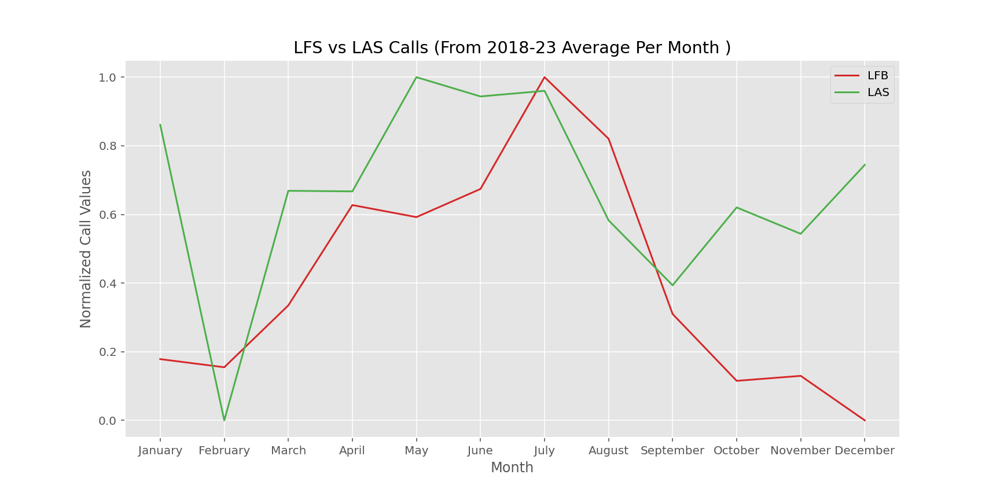

In [53]:
# Group both dataframes by month and get the mean of total_incidents and NumCalls for each month
las_grouped = las.groupby('month', as_index=False)['total_incidents'].mean()
lfb_grouped = lfb.groupby('CalMonth', as_index=False)['NumCalls'].mean()

# Rename columns for clarity and consistency
las_grouped.rename(columns={'month': 'Month', 'total_incidents': 'LAS_Calls'}, inplace=True)
lfb_grouped.rename(columns={'CalMonth': 'Month', 'NumCalls': 'LFB_Calls'}, inplace=True)

# Merge both dataframes
avg_calls_comp = pd.merge(las_grouped, lfb_grouped, how='inner', on='Month')

# Apply the scaler to 'LFB_Calls' and 'LAS_Calls'
avg_calls_comp[['LFB_Calls_norm', 'LAS_Calls_norm']] = scaler.fit_transform(avg_calls_comp[['LFB_Calls', 'LAS_Calls']])

# Create a list of month names in correct order
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Convert the 'Month' column to a categorical type
avg_calls_comp['Month'] = pd.Categorical(avg_calls_comp['Month'], categories=months_order, ordered=True)

# Sort the dataframe by 'Month' before plotting
avg_calls_comp_sorted = avg_calls_comp.sort_values(by='Month')

# Now re-plot your data
plt.figure(figsize=(12,6))

plt.plot(avg_calls_comp_sorted['Month'], avg_calls_comp_sorted['LFB_Calls_norm'], label='LFB', color='#d62728')
plt.plot(avg_calls_comp_sorted['Month'], avg_calls_comp_sorted['LAS_Calls_norm'], label='LAS', color='#4daf4a')
plt.legend(loc='best')
plt.title('LFS vs LAS Calls (From 2018-23 Average Per Month )')
plt.xlabel('Month')
plt.ylabel('Normalized Call Values')
plt.show()

## LAS HeatMap for Number of Calls in Boroughs

**HeatMap of Last 3 years**

In [54]:
# Generate a base map centered around the median latitude and longitude of your data
base_map = folium.Map(location=[merged_df['latitude'].median(), merged_df['longitude']
                                .median()], zoom_start=10, tiles='stamentoner')

# Prepare data for the heatmap
heatmap_data = merged_df[['latitude', 'longitude', 'total_incidents']]

# Drop any rows with NaN values
heatmap_data = heatmap_data.dropna()

# Convert data to list for the HeatMap function
heatmap_list = heatmap_data.values.tolist()

# Create a weight column for the heatmap where 'total_incidents' is normalized 
heatmap_data['weight'] = heatmap_data['total_incidents'] / heatmap_data['total_incidents'].abs().max()

# Create the HeatMap and add it to the base_map
hm = HeatMap(heatmap_list, gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'}, 
                min_opacity=0.05, 
                max_opacity=0.9, 
                radius=25,
                use_local_extrema=False)
base_map.add_child(hm)

# Save the map as .html
base_map.save('../figures/HeatMap_Figs/LAS HeatMap of Last 3 Years Alone.html')
# Show the map
base_map


**HeatMap of Last Year Alone**

In [55]:
# Filter for the date range
filtered_IncidentsLSOA = merged_df[((merged_df['year'] == 2022) & (merged_df['month'] == "January")) |
                                        ((merged_df['year'] == 2023) & (merged_df['month'] == "January"))]

# Generate a base map centered around the median latitude and longitude of your data
base_map = folium.Map(location=[filtered_IncidentsLSOA['latitude']
                                .median(), filtered_IncidentsLSOA['longitude'].median()], 
                      zoom_start=10, tiles='stamentoner')

# Prepare data for the heatmap
heatmap_data = filtered_IncidentsLSOA[['latitude', 'longitude', 'total_incidents']]

# Drop any rows with NaN values
heatmap_data = heatmap_data.dropna()

# Convert data to list for the HeatMap function
heatmap_list = heatmap_data.values.tolist()

# Create a weight column for the heatmap where 'total_incidents' is normalized 
heatmap_data['weight'] = heatmap_data['total_incidents'] / heatmap_data['total_incidents'].abs().max()

# Create the HeatMap and add it to the base_map
hm = HeatMap(heatmap_list, gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'}, 
                min_opacity=0.05, 
                max_opacity=0.9, 
                radius=25,
                use_local_extrema=False)
base_map.add_child(hm)

# Save the map as .html
base_map.save('../figures/HeatMap_Figs/LAS HeatMap of Last Year Alone.html')
# Show the map
base_map


-----------------